In [1]:
ls

Amazon_ACD_2003_500m_Mgha.tif              LICENSE
Amazon_ACD_Change_2003_2016_500m_Mgha.tif  msk_paises.gdb.tar.gz
Data-Analysis.ipynb                        README.md


In [2]:
import numpy as np
import numpy.ma as ma

import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import matplotlib.colors as colors

import rasterio
from rasterio.plot import show

In [3]:
#import gudhi as gd

In [4]:
%matplotlib inline

In [5]:
baseline = rasterio.open('Amazon_ACD_2003_500m_Mgha.tif')
change = rasterio.open('Amazon_ACD_Change_2003_2016_500m_Mgha.tif')

In [6]:
print(change.width)
print(change.height)
print(change.bounds)
print(change.transform)
print(change.indexes)

8540
6773
BoundingBox(left=-8803405.32670005, bottom=-2019579.70229995, right=-4846714.86870007, top=1118437.21480004)
| 463.31, 0.00,-8803405.33|
| 0.00,-463.31, 1118437.21|
| 0.00, 0.00, 1.00|
(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13)


In [7]:
def sum_array_up_to(n):
    
    cumulative_change = np.zeros((change.height, change.width))
    for n in range(1,n+1):
        cumulative_change = np.add(cumulative_change,ma.masked_equal(change.read(n), -32768))
    return cumulative_change

In [8]:
max_idx = max(change.indexes)
cumulative_change = sum_array_up_to(max_idx)

In [9]:
top = cm.get_cmap('Reds_r', 128)
bottom = cm.get_cmap('Greens', 128)

newcolors = np.vstack((top(np.linspace(0, 1, 128)),
                       bottom(np.linspace(0, 1, 128))))
newcmp = ListedColormap(newcolors,name='RedGreen')

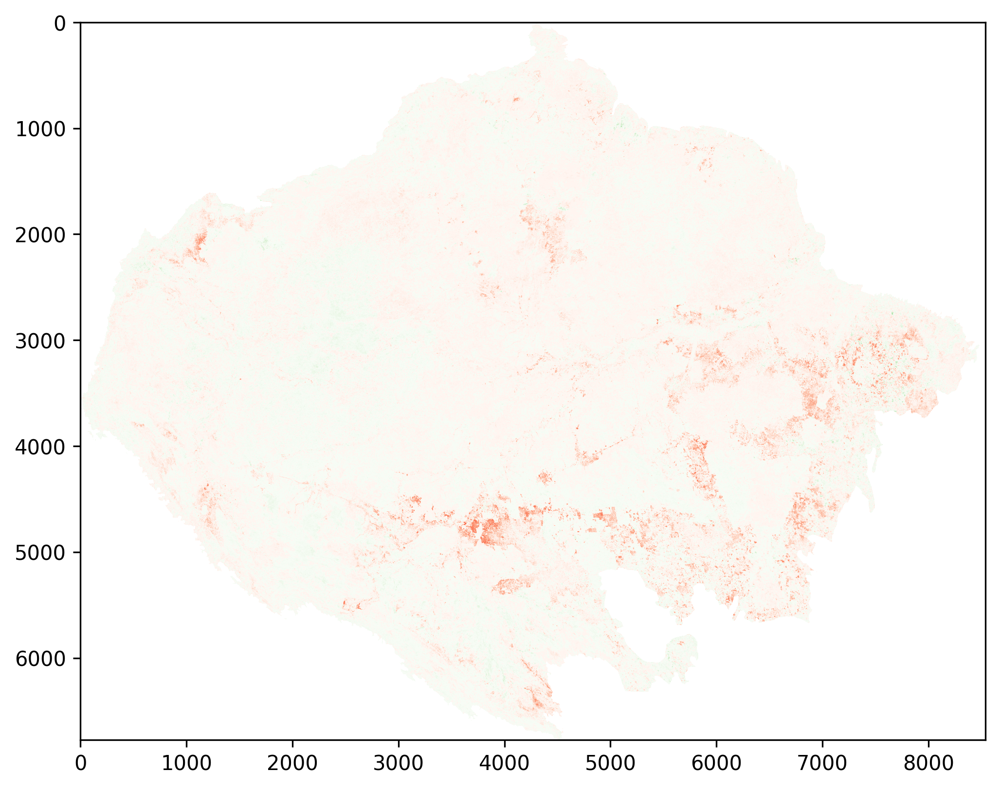

<AxesSubplot:>

In [10]:
fig = plt.figure(figsize=(8,8),dpi=300)

show(cumulative_change, norm=colors.CenteredNorm(),cmap=newcmp)

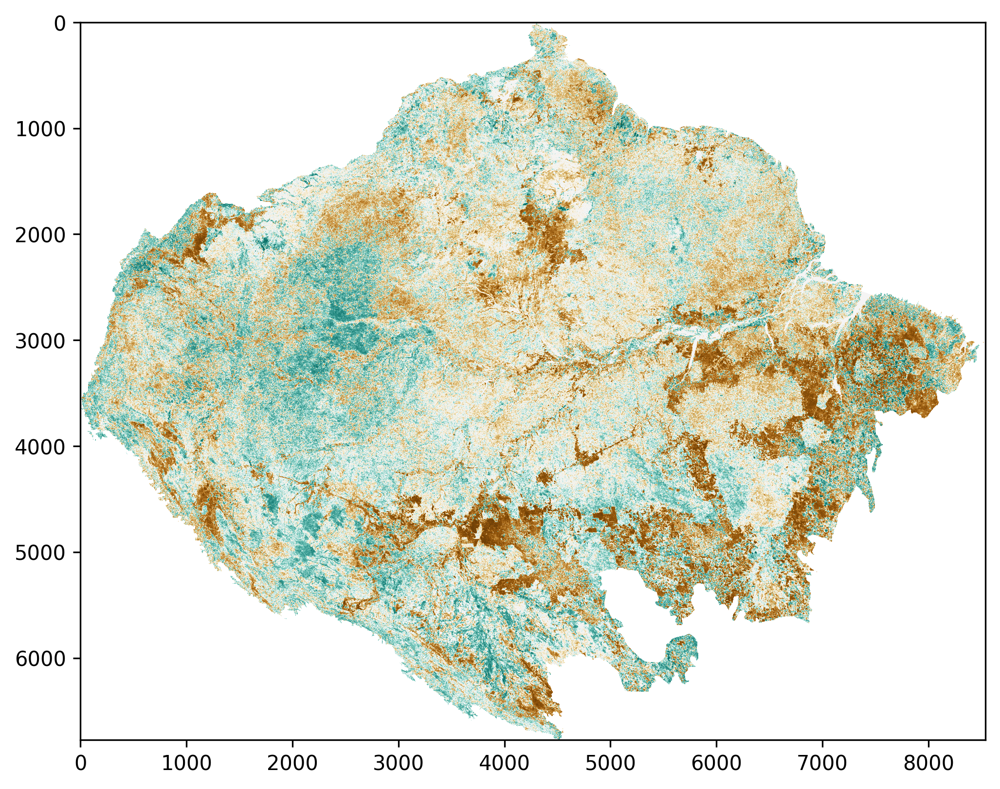

<AxesSubplot:>

In [17]:
fig = plt.figure(figsize=(8,8),dpi=300)

show(cumulative_change,norm=colors.SymLogNorm(linthresh=1),cmap='BrBG')

In [26]:
#set vmax to end year max, and sum cummulatively for each year to make anim

print(change_dict[1].max())
print(change_dict[13].max())

117.0
215.0


In [27]:
change_dict = {}
for idx in change.indexes:

    cumulative_change = sum_array_up_to(idx)
    change_dict[idx] = cumulative_change
    print(change_dict[idx].max())


117.0
123.0
124.0
137.0
120.0
134.0
122.0
122.0
135.0
140.0
141.0
178.0
215.0


In [35]:
vmin = change_dict[13].min()
vmax = change_dict[13].max()

-201.0

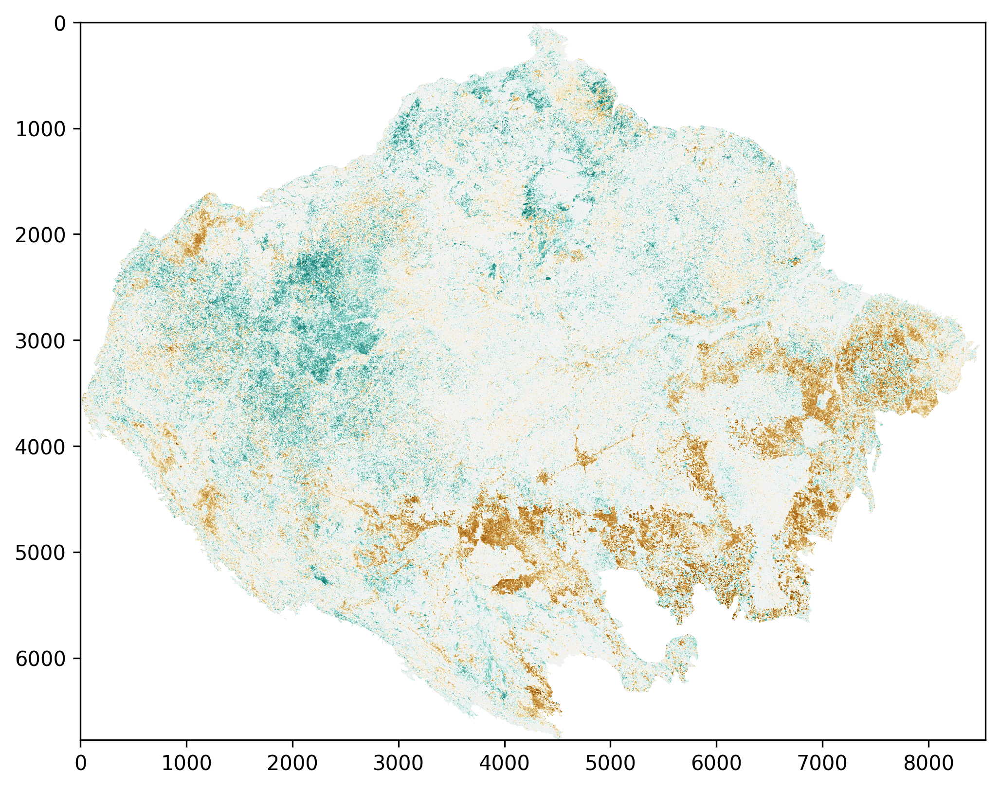

<AxesSubplot:>

In [37]:
fig = plt.figure(figsize=(8,8),dpi=300)

show(change_dict[1],norm=colors.SymLogNorm(linthresh=1),cmap='BrBG')

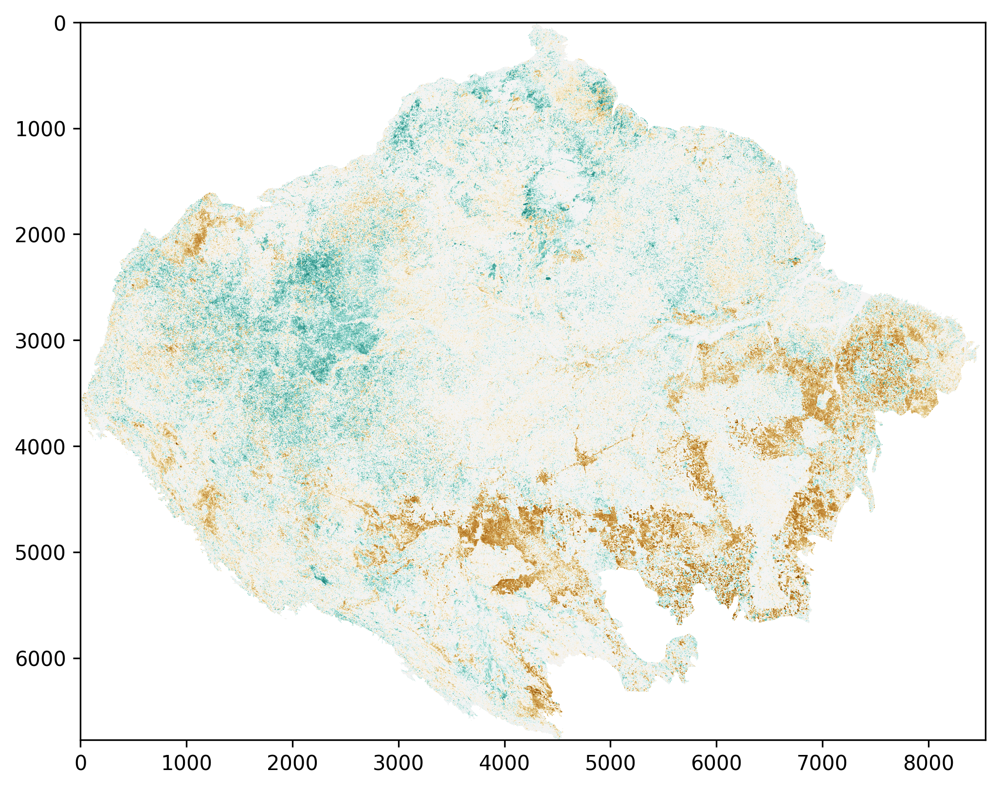

<AxesSubplot:>

In [36]:
fig = plt.figure(figsize=(8,8),dpi=300)

show(change_dict[1],norm=colors.SymLogNorm(linthresh=1,vmin = vmin,vmax = vmax),cmap='BrBG')

In [ ]:
from sklearn import linear_model
reg = linear_model.LinearRegression()
reg.fit([[0, 0], [1, 1], [2, 2]], [0, 1, 2])
reg.coef_


In [ ]:
x = ma.masked_equal(change.read(), -32768)

In [ ]:
x[0,:,:]